In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
'''
import os
os.chdir("/content/drive/MyDrive/RC/orgtst/")
'''

In [ ]:
#!python tracker2.py

In [ ]:
'''
import cv2
from tracker2 import *
import numpy as np
from google.colab.patches import cv2_imshow
end = 0

#Creater Tracker Object
tracker = EuclideanDistTracker()

#cap = cv2.VideoCapture("Resources/traffic3.mp4")
cap = cv2.VideoCapture("traffic4.mp4")
f = 25
w = int(1000/(f-1))
print(w)


#Object Detection
object_detector = cv2.createBackgroundSubtractorMOG2(100,5)
#100,5

#KERNALS
kernalOp = np.ones((3,3),np.uint8)
kernalOp2 = np.ones((5,5),np.uint8)
kernalCl = np.ones((11,11),np.uint8)
fgbg=cv2.createBackgroundSubtractorMOG2(detectShadows=True)
kernal_e = np.ones((5,5),np.uint8)
i = 0
while True:
    ret,frame = cap.read()
    frame = cv2.resize(frame, None, fx=0.5, fy=0.5)
    height,width,_ = frame.shape
    #print(height,width)
    #540,960


    #Extract ROI
    roi = frame[50:540,200:960]

    #MASKING METHOD 1
    mask = object_detector.apply(roi)
    _, mask = cv2.threshold(mask, 250, 255, cv2.THRESH_BINARY)

    #DIFFERENT MASKING METHOD 2 -> This is used
    fgmask = fgbg.apply(roi)
    ret, imBin = cv2.threshold(fgmask, 200, 255, cv2.THRESH_BINARY)
    mask1 = cv2.morphologyEx(imBin, cv2.MORPH_OPEN, kernalOp)
    mask2 = cv2.morphologyEx(mask1, cv2.MORPH_CLOSE, kernalCl)
    e_img = cv2.erode(mask2, kernal_e)


    contours,_ = cv2.findContours(e_img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    detections = []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        #THRESHOLD
        if area > 1000:
            x,y,w,h = cv2.boundingRect(cnt)
            cv2.rectangle(roi,(x,y),(x+w,y+h),(0,255,0),3)
            detections.append([x,y,w,h])

    #Object Tracking
    boxes_ids = tracker.update(detections)
    for box_id in boxes_ids:
        x,y,w,h,id = box_id


        if(tracker.getsp(id)<tracker.limit()):
            cv2.putText(roi,str(id)+" "+str(tracker.getsp(id)),(x,y-15), cv2.FONT_HERSHEY_PLAIN,1,(255,255,0),2)
            cv2.rectangle(roi, (x, y), (x + w, y + h), (0, 255, 0), 3)
        else:
            cv2.putText(roi,str(id)+ " "+str(tracker.getsp(id)),(x, y-15),cv2.FONT_HERSHEY_PLAIN, 1,(0, 0, 255),2)
            cv2.rectangle(roi, (x, y), (x + w, y + h), (0, 165, 255), 3)

        s = tracker.getsp(id)
        if (tracker.f[id] == 1 and s != 0):
            tracker.capture(roi, x, y, h, w, s, id)

    # DRAW LINES

    cv2.line(roi, (0, 410), (960, 410), (0, 0, 255), 2)
    cv2.line(roi, (0, 430), (960, 430), (0, 0, 255), 2)

    cv2.line(roi, (0, 235), (960, 235), (0, 0, 255), 2)
    cv2.line(roi, (0, 255), (960, 255), (0, 0, 255), 2)


    #DISPLAY
    #cv2.imshow("Mask",mask2)
    #cv2.imshow("Erode", e_img)
    #cv2_imshow(roi)
    cv2.imwrite('/content/drive/MyDrive/RC/orgtst/captureimg/pic{:>05}.jpg'.format(i), roi)
    i = i + 1

    key = cv2.waitKey(w-10)
    if key==27:
        tracker.end()
        end=1
        break

if(end!=1):
    tracker.end()

cap.release()
cv2.destroyAllWindows()
'''

'\nimport cv2\nfrom tracker2 import *\nimport numpy as np\nfrom google.colab.patches import cv2_imshow\nend = 0\n\n#Creater Tracker Object\ntracker = EuclideanDistTracker()\n\n#cap = cv2.VideoCapture("Resources/traffic3.mp4")\ncap = cv2.VideoCapture("traffic4.mp4")\nf = 25\nw = int(1000/(f-1))\nprint(w)\n\n\n#Object Detection\nobject_detector = cv2.createBackgroundSubtractorMOG2(100,5)\n#100,5\n\n#KERNALS\nkernalOp = np.ones((3,3),np.uint8)\nkernalOp2 = np.ones((5,5),np.uint8)\nkernalCl = np.ones((11,11),np.uint8)\nfgbg=cv2.createBackgroundSubtractorMOG2(detectShadows=True)\nkernal_e = np.ones((5,5),np.uint8)\ni = 0\nwhile True:\n    ret,frame = cap.read()\n    frame = cv2.resize(frame, None, fx=0.5, fy=0.5)\n    height,width,_ = frame.shape\n    #print(height,width)\n    #540,960\n\n\n    #Extract ROI\n    roi = frame[50:540,200:960]\n\n    #MASKING METHOD 1\n    mask = object_detector.apply(roi)\n    _, mask = cv2.threshold(mask, 250, 255, cv2.THRESH_BINARY)\n\n    #DIFFERENT MASKING

In [ ]:
'''
import cv2
from google.colab.patches import cv2_imshow
import time  history=None,varThreshold=None
cap = cv2.VideoCapture('/content/drive/MyDrive/RC/speedf/videoplayback.mp4')  #Path to footage
car_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/RC/speedf/haarcascade_car.xml')  #Path to cars.xml
#Coordinates of polygon in frame::: [[x1,y1],[x2,y2],[x3,y3],[x4,y4]]
coord=[[637,352],[904,352],[631,512],[952,512]]
#Distance between two horizontal lines in (meter)
dist = 3
i = 0
while True:
    ret, img = cap.read()
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    cars=car_cascade.detectMultiScale(gray,1.1,2)
    for (x,y,w,h) in cars:
        cv2.rectangle(img,(x,y),(x+w,y+h),(225,0,0),2)
    cv2.line(img, (coord[0][0],coord[0][1]),(coord[1][0],coord[1][1]),(0,0,255),2)   #First horizontal line
    cv2.line(img, (coord[0][0],coord[0][1]), (coord[2][0],coord[2][1]), (0, 0, 255), 2) #Vertical left line
    cv2.line(img, (coord[2][0],coord[2][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Second horizontal line
    cv2.line(img, (coord[1][0],coord[1][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Vertical right line
    for (x, y, w, h) in cars:
        if(x>=coord[0][0] and y==coord[0][1]):
            cv2.line(img, (coord[0][0], coord[0][1]), (coord[1][0], coord[1][1]), (0, 255,0), 2) #Changes line color to green
            tim1= time.time() #Initial time
            print("Car Entered.")
        if (x>=coord[2][0] and y==coord[2][1]):
            cv2.line(img, (coord[2][0],coord[2][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Changes line color to green
            tim2 = time.time() #Final time
            print("Car Left.")
            #We know that distance is 3m
            print("Speed in (m/s) is:", dist/((tim2-tim1)))
    cv2.imwrite('/content/drive/MyDrive/RC/testf/pic{:>05}.jpg'.format(i), img)
    i = i + 1
    #cv2_imshow(img) #Shows the frame
    if cv2.waitKey(20) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()
'''

'\nimport cv2\nfrom google.colab.patches import cv2_imshow\nimport time  history=None,varThreshold=None\ncap = cv2.VideoCapture(\'/content/drive/MyDrive/RC/speedf/videoplayback.mp4\')  #Path to footage\ncar_cascade = cv2.CascadeClassifier(\'/content/drive/MyDrive/RC/speedf/haarcascade_car.xml\')  #Path to cars.xml\n#Coordinates of polygon in frame::: [[x1,y1],[x2,y2],[x3,y3],[x4,y4]]\ncoord=[[637,352],[904,352],[631,512],[952,512]]\n#Distance between two horizontal lines in (meter)\ndist = 3\ni = 0\nwhile True:\n    ret, img = cap.read()\n    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)\n    cars=car_cascade.detectMultiScale(gray,1.1,2)\n    for (x,y,w,h) in cars:\n        cv2.rectangle(img,(x,y),(x+w,y+h),(225,0,0),2)\n    cv2.line(img, (coord[0][0],coord[0][1]),(coord[1][0],coord[1][1]),(0,0,255),2)   #First horizontal line\n    cv2.line(img, (coord[0][0],coord[0][1]), (coord[2][0],coord[2][1]), (0, 0, 255), 2) #Vertical left line\n    cv2.line(img, (coord[2][0],coord[2][1]), (coord[3

In [ ]:
'''
import time
import numpy as np
import cv2# Create our body classifier
car_classifier = cv2.CascadeClassifier('/content/drive/MyDrive/RC/speedf/haarcascade_car.xml')# Initiate video capture for video file
cap = cv2.VideoCapture('/content/drive/MyDrive/RC/speedf/videoplayback.mp4')# Loop once video is successfully loaded
i = 0
while cap.isOpened():
    
    time.sleep(.05)
    # Read first frame
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
   
    # Pass frame to our car classifier
    cars = car_classifier.detectMultiScale(gray, 1.1, 2)
    # Extract bounding boxes for any bodies identified
    for (x,y,w,h) in cars:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
        #print(x,y,w,h)
        #cv2.imwrite('/content/drive/MyDrive/RC/testf/pic{:>05}.jpg'.format(i), frame)
        i = i + 1
    cv2.line(frame, (coord[0][0],coord[0][1]),(coord[1][0],coord[1][1]),(0,0,255),2)   #First horizontal line
    cv2.line(frame, (coord[0][0],coord[0][1]), (coord[2][0],coord[2][1]), (0, 0, 255), 2) #Vertical left line
    cv2.line(frame, (coord[2][0],coord[2][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Second horizontal line
    cv2.line(frame, (coord[1][0],coord[1][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Vertical right line
    for (x, y, w, h) in cars:
        if(x>=coord[0][0] and y==coord[0][1]):
            cv2.line(frame, (coord[0][0], coord[0][1]), (coord[1][0], coord[1][1]), (0, 255,0), 2) #Changes line color to green
            tim1= time.time() #Initial time
            print("Car Entered.")
        if (x>=coord[2][0] and y==coord[2][1]):
            cv2.line(frame, (coord[2][0],coord[2][1]), (coord[3][0], coord[3][1]), (0, 0, 255), 2) #Changes line color to green
            tim2 = time.time() #Final time
            print("Car Left.")
            #We know that distance is 3m
            print("Speed in (m/s) is:", dist/((tim2-tim1)))
cv2.destroyAllWindows()
'''

'\nimport time\nimport numpy as np\nimport cv2# Create our body classifier\ncar_classifier = cv2.CascadeClassifier(\'/content/drive/MyDrive/RC/speedf/haarcascade_car.xml\')# Initiate video capture for video file\ncap = cv2.VideoCapture(\'/content/drive/MyDrive/RC/speedf/videoplayback.mp4\')# Loop once video is successfully loaded\ni = 0\nwhile cap.isOpened():\n    \n    time.sleep(.05)\n    # Read first frame\n    ret, frame = cap.read()\n    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)\n   \n    # Pass frame to our car classifier\n    cars = car_classifier.detectMultiScale(gray, 1.1, 2)\n    # Extract bounding boxes for any bodies identified\n    for (x,y,w,h) in cars:\n        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)\n        #print(x,y,w,h)\n        #cv2.imwrite(\'/content/drive/MyDrive/RC/testf/pic{:>05}.jpg\'.format(i), frame)\n        i = i + 1\n    cv2.line(frame, (coord[0][0],coord[0][1]),(coord[1][0],coord[1][1]),(0,0,255),2)   #First horizontal line\n    c

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import time
cascade_src = '/content/drive/MyDrive/RC/orgtst/cars1.xml'
video_src = '/content/drive/MyDrive/RC/orgtst/traffic4.mp4'
#line a
'''
ax1=70
ay=90
ax2=230
'''
ax1=690
ay=90
ax2=1150
#line b
'''
bx1=15
by=125
bx2=225
'''
bx1=690
by=125
bx2=1150
#car num
i = 1
j = 0
start_time = time.time()
#video ....
cap = cv2.VideoCapture(video_src)
car_cascade = cv2.CascadeClassifier(cascade_src)

def Speed_Cal(time):
    #Here i converted m to Km and second to hour then divison to reach Speed in this form (KM/H) 
    #the 9.144 is distance of free space between two lines # found in https://news.osu.edu/slow-down----those-lines-on-the-road-are-longer-than-you-think/
    #i know that the 9.144 is an standard and my video may not be that but its like guess and its need Field research
    try:
        #Speed = (9.144*3600)/(time*1000)
        Speed = (114*3600)/(time*1000)
        return Speed
    except ZeroDivisionError:
        print (5)

In [ ]:
while True:
    ret, img = cap.read()
    if (type(img) == type(None)):
        break
    #bluring to have exacter detection
    blurred = cv2.blur(img,ksize=(15,15))
    gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    cars = car_cascade.detectMultiScale(gray, 1.1, 2)
    
    #line a #i know road has got 
    cv2.line(img,(ax1,ay),(ax2,ay),(255,0,0),2)
    #line b
    cv2.line(img,(bx1,by),(bx2,by),(255,0,0),2)
    
    for (x,y,w,h) in cars:
        frame = img.copy()
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),2)   
        cv2.circle(img,(int((x+x+w)/2),int((y+y+h)/2)),1,(0,255,0),-1)
        
        while int(ay) == int((y+y+h)/2):
            start_time = time.time()
            break
            
        while int(ay) <= int((y+y+h)/2):
            if int(by) <= int((y+y+h)/2)&int(by+10) >= int((y+y+h)/2):
                cv2.line(img,(bx1,by),(bx2,by),(0,255,0),2)
                Speed = Speed_Cal(time.time() - start_time)
                print("Car Number "+str(i)+" Speed: "+str(Speed))
                i = i + 1
                cv2.putText(img, "Speed: "+str(Speed)+"KM/H", (x,y-15), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0),3);
                if Speed > 80:
                  cv2.imwrite('/content/drive/MyDrive/RC/orgtst/img32/pic{:>05}.jpg'.format(i), frame)
                  cv2.imwrite('/content/drive/MyDrive/RC/orgtst/img3/pic{:>05}.jpg'.format(i), img)
                break
            else :
                cv2.putText(img, "Calcuting", (100,200), cv2.FONT_HERSHEY_SIMPLEX, 1,(0,255,0),3)
                break
                
                
    #cv2.imshow('video', img)
    #cv2_imshow(img)
    cv2.imwrite('/content/drive/MyDrive/RC/orgtst/img31/pic{:>05}.jpg'.format(j), img)
    j = j + 1
    
    if cv2.waitKey(33) == 27:
        break

cv2.destroyAllWindows()

Car Number 1 Speed: 102.39502339002169
Car Number 2 Speed: 91.01982053361482
Car Number 3 Speed: 81.61958138952436
Car Number 4 Speed: 74.27488780077611
Car Number 5 Speed: 69.26121637938166
Car Number 6 Speed: 64.79386386757639


KeyboardInterrupt: ignored

In [ ]:
'''
import os
import sys
import numpy as np
from monk.pytorch_prototype import prototype
import matplotlib.pyplot as plt     # To display the images
import matplotlib.image as mpimg
os.chdir("/content/drive/MyDrive/RC")  # Change directory to Project_directory
'''

In [ ]:
'''
folder1 = "/content/drive/MyDrive/RC/orgtst/img32/"
folder2 = "/content/drive/MyDrive/RC/orgtst/img3/"
def renamefolder(folder):
  for count, filename in enumerate(os.listdir(folder)):
    dst = f"car{str(count)}.jpg"
    src =f"{folder}/{filename}"  # foldername/filename, if .py file is outside folder
    dst =f"{folder}/{dst}"
    os.rename(src, dst)

renamefolder(folder1)
renamefolder(folder2)
'''

In [ ]:
#! pip install -U monk-colab

In [ ]:
'''
# Load model for some sample outputs
gtf = prototype(verbose=0);
gtf.Prototype("Make_classifier", "inception-v3-pytorch", eval_infer=True);
'''

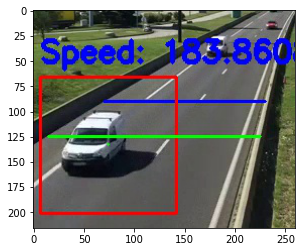

Predicted Class: Mercedes-Benz
Prediction Score:  0.18247788


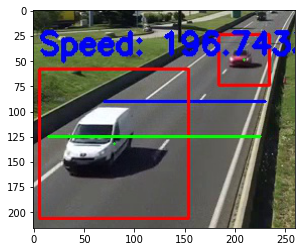

Predicted Class: Eagle
Prediction Score:  0.17027737


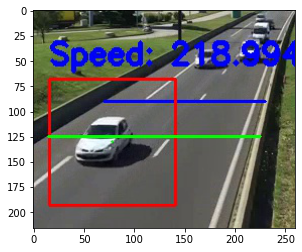

Predicted Class: Mercedes-Benz
Prediction Score:  0.13695657


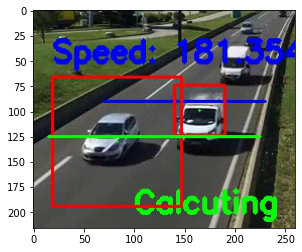

Predicted Class: Ford
Prediction Score:  0.29998213


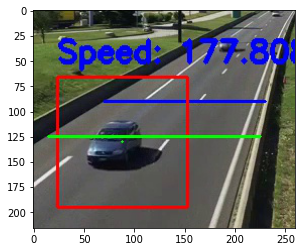

Predicted Class: Eagle
Prediction Score:  0.2809689


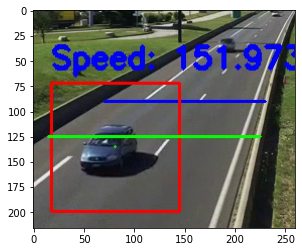

Predicted Class: Eagle
Prediction Score:  0.18954404


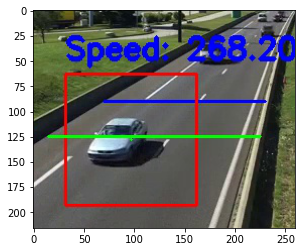

Predicted Class: Aston
Prediction Score:  0.31750247


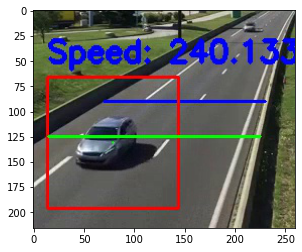

Predicted Class: Lamborghini
Prediction Score:  0.32813525


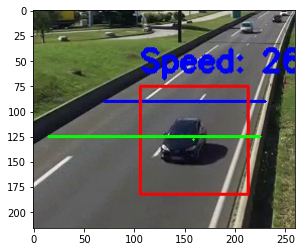

Predicted Class: Lamborghini
Prediction Score:  0.61837757


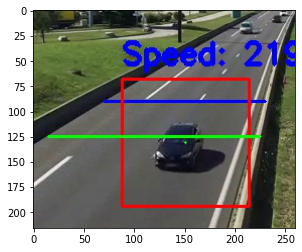

Predicted Class: Lamborghini
Prediction Score:  0.6407209


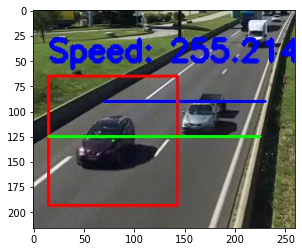

Predicted Class: Lamborghini
Prediction Score:  0.34135008


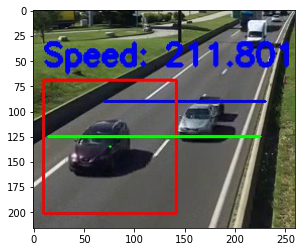

Predicted Class: Lamborghini
Prediction Score:  0.25908953


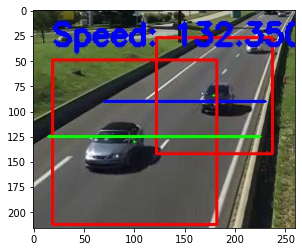

Predicted Class: Lamborghini
Prediction Score:  0.47291622


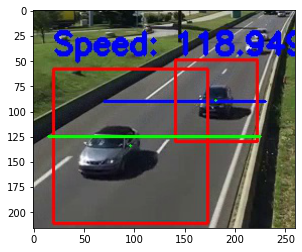

Predicted Class: Aston
Prediction Score:  0.5998867


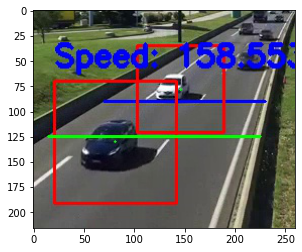

Predicted Class: Lamborghini
Prediction Score:  0.59224707


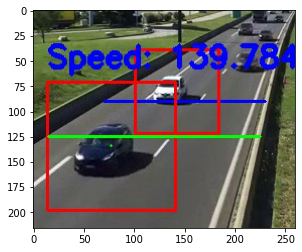

Predicted Class: Lamborghini
Prediction Score:  0.241943


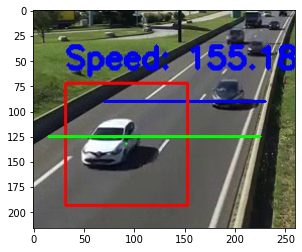

Predicted Class: Aston
Prediction Score:  0.14957438


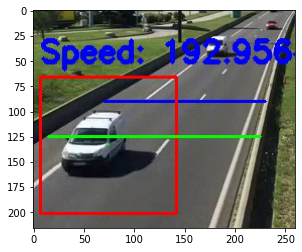

Predicted Class: Mercedes-Benz
Prediction Score:  0.18247788


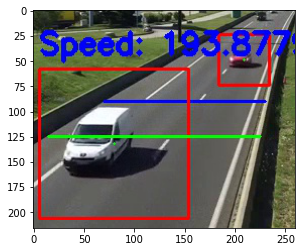

Predicted Class: Eagle
Prediction Score:  0.17027737


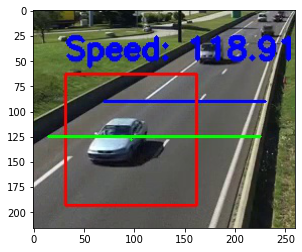

Predicted Class: Aston
Prediction Score:  0.31750247


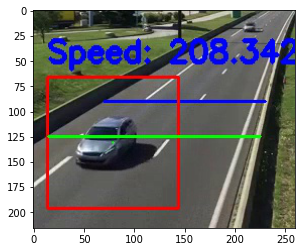

Predicted Class: Lamborghini
Prediction Score:  0.32813525


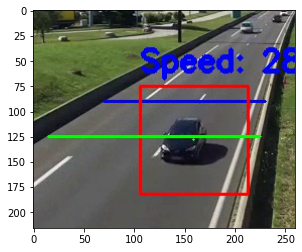

Predicted Class: Lamborghini
Prediction Score:  0.61837757


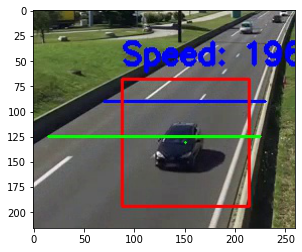

Predicted Class: Lamborghini
Prediction Score:  0.6407209


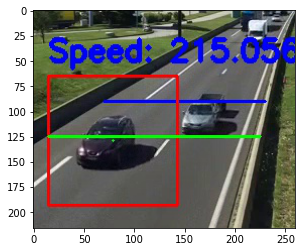

Predicted Class: Lamborghini
Prediction Score:  0.34135008


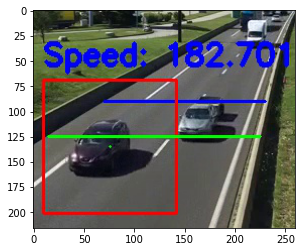

Predicted Class: Lamborghini
Prediction Score:  0.25908953


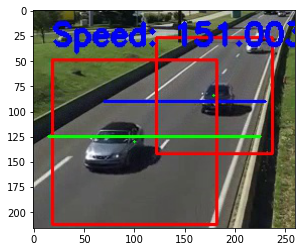

Predicted Class: Lamborghini
Prediction Score:  0.47291622


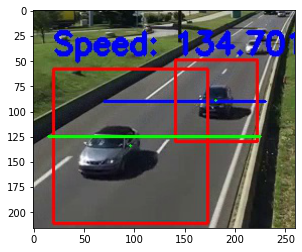

Predicted Class: Aston
Prediction Score:  0.5998867


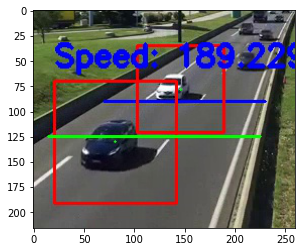

Predicted Class: Lamborghini
Prediction Score:  0.59224707


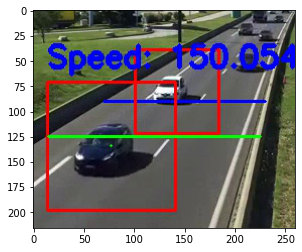

Predicted Class: Lamborghini
Prediction Score:  0.241943


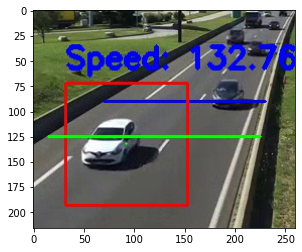

Predicted Class: Aston
Prediction Score:  0.14957438


In [ ]:
'''
def imageshow(img_count):
  for i in range(img_count):
    img_name1 = "/content/drive/MyDrive/RC/orgtst/img32/car{}.jpg".format(i)
    img1=mpimg.imread(img_name1)
    img_name2 = "/content/drive/MyDrive/RC/orgtst/img3/car{}.jpg".format(i)
    img2=mpimg.imread(img_name2)
    plt.imshow(img2)
    plt.show()
    predictions = gtf.Infer(img_name=img_name1, return_raw=False);
    print("Predicted Class: "+predictions['predicted_class'].replace('_',''))
    print("Prediction Score: ",predictions['score'])

path, dirs, files = next(os.walk("/content/drive/MyDrive/RC/orgtst/img32/"))
file_count = len(files)
imageshow(file_count)
'''

In [ ]:
'''
# Load model for some sample outputs
gtf = prototype(verbose=0);
gtf.Prototype("Model_classifier", "inception-v3-pytorch", eval_infer=True);
'''

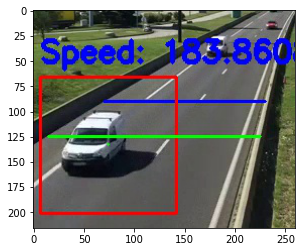

Predicted Class: GallardoLP570-4
Prediction Score:  0.106771864


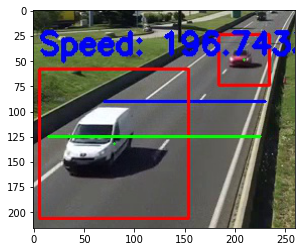

Predicted Class: GallardoLP570-4
Prediction Score:  0.28455648


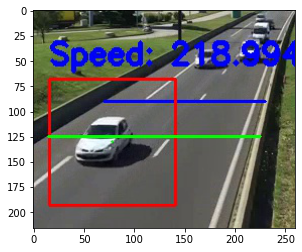

Predicted Class: GallardoLP570-4
Prediction Score:  0.16944739


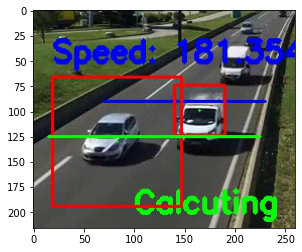

Predicted Class: Diablo
Prediction Score:  0.25695807


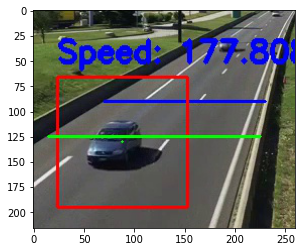

Predicted Class: GallardoLP570-4
Prediction Score:  0.09787726


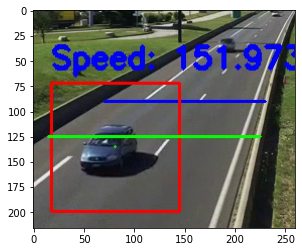

Predicted Class: GallardoLP570-4
Prediction Score:  0.14622562


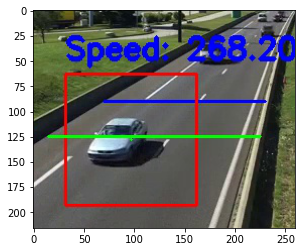

Predicted Class: GallardoLP570-4
Prediction Score:  0.10951993


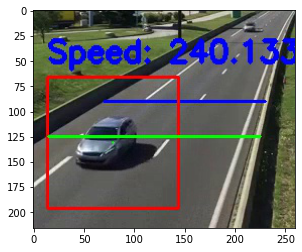

Predicted Class: GallardoLP570-4
Prediction Score:  0.16699226


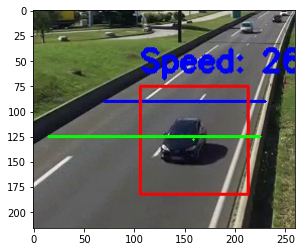

Predicted Class: GallardoLP570-4
Prediction Score:  0.15163209


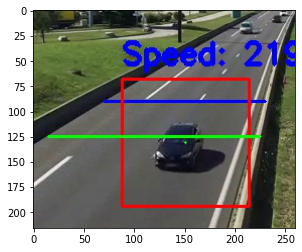

Predicted Class: GallardoLP570-4
Prediction Score:  0.13914116


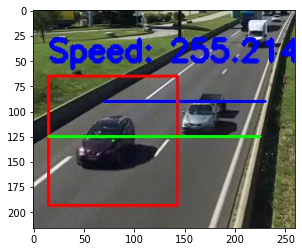

Predicted Class: GallardoLP570-4
Prediction Score:  0.14671156


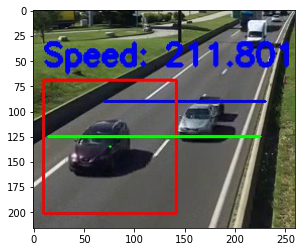

Predicted Class: Reventon
Prediction Score:  0.17437041


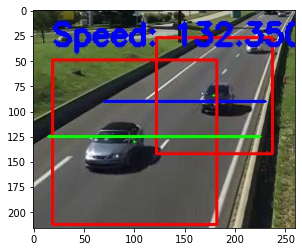

Predicted Class: GallardoLP570-4
Prediction Score:  0.3693619


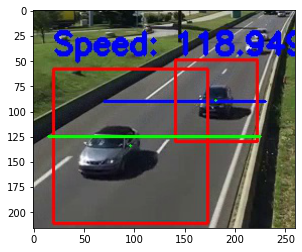

Predicted Class: GallardoLP570-4
Prediction Score:  0.39898086


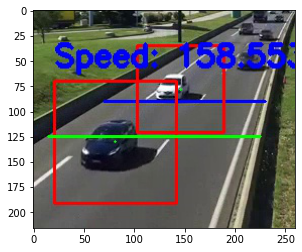

Predicted Class: GallardoLP570-4
Prediction Score:  0.22190633


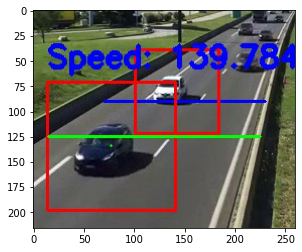

Predicted Class: GallardoLP570-4
Prediction Score:  0.16418284


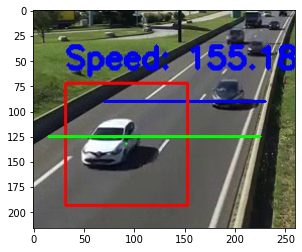

Predicted Class: GallardoLP570-4
Prediction Score:  0.18567997


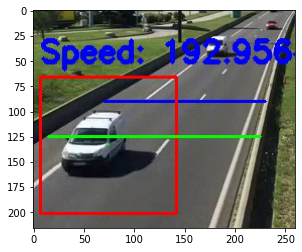

Predicted Class: GallardoLP570-4
Prediction Score:  0.106771864


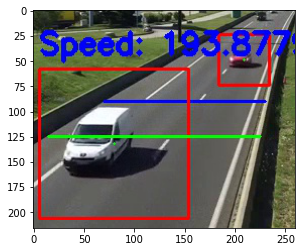

Predicted Class: GallardoLP570-4
Prediction Score:  0.28455648


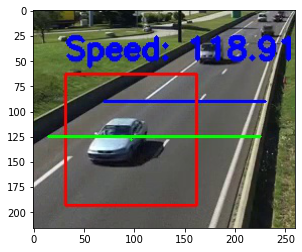

Predicted Class: GallardoLP570-4
Prediction Score:  0.10951993


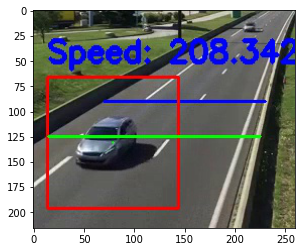

Predicted Class: GallardoLP570-4
Prediction Score:  0.16699226


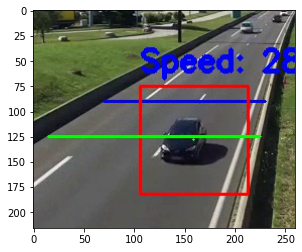

Predicted Class: GallardoLP570-4
Prediction Score:  0.15163209


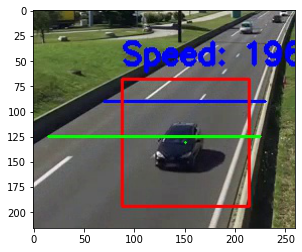

Predicted Class: GallardoLP570-4
Prediction Score:  0.13914116


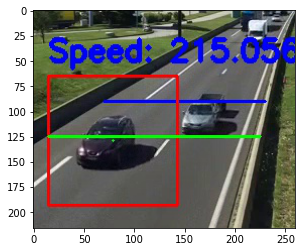

Predicted Class: GallardoLP570-4
Prediction Score:  0.14671156


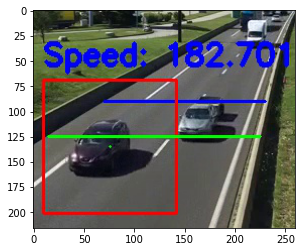

Predicted Class: Reventon
Prediction Score:  0.17437041


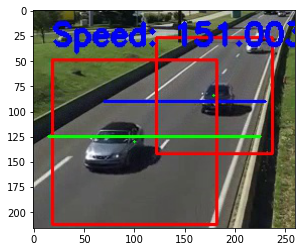

Predicted Class: GallardoLP570-4
Prediction Score:  0.3693619


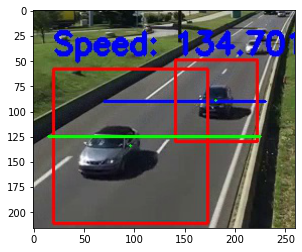

Predicted Class: GallardoLP570-4
Prediction Score:  0.39898086


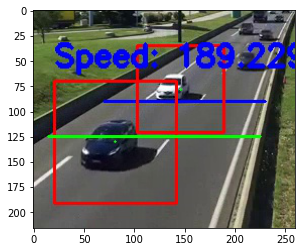

Predicted Class: GallardoLP570-4
Prediction Score:  0.22190633


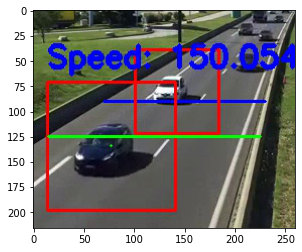

Predicted Class: GallardoLP570-4
Prediction Score:  0.16418284


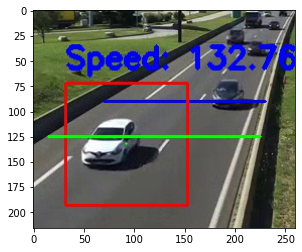

Predicted Class: GallardoLP570-4
Prediction Score:  0.18567997


In [ ]:
'''
def imageshow(img_count):
  for i in range(img_count):
    img_name1 = "/content/drive/MyDrive/RC/orgtst/img32/car{}.jpg".format(i)
    img1=mpimg.imread(img_name1)
    img_name2 = "/content/drive/MyDrive/RC/orgtst/img3/car{}.jpg".format(i)
    img2=mpimg.imread(img_name2)
    plt.imshow(img2)
    plt.show()
    predictions = gtf.Infer(img_name=img_name1, return_raw=False);
    print("Predicted Class: "+predictions['predicted_class'].replace('_',''))
    print("Prediction Score: ",predictions['score'])

path, dirs, files = next(os.walk("/content/drive/MyDrive/RC/orgtst/img32/"))
file_count = len(files)
imageshow(file_count)
'''

In [ ]:
'''
# Load model for some sample outputs
gtf = prototype(verbose=0);
gtf.Prototype("Year_classifier", "inception-v3-pytorch", eval_infer=True);
'''

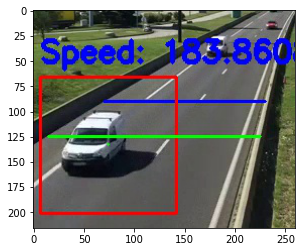

Predicted Class: 2012
Prediction Score:  0.7265134


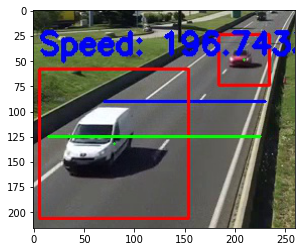

Predicted Class: 2012
Prediction Score:  0.98730624


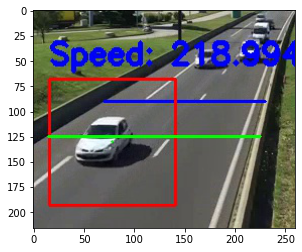

Predicted Class: 1998
Prediction Score:  0.26924565


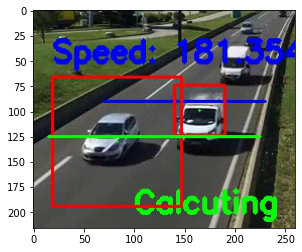

Predicted Class: 2012
Prediction Score:  0.9673088


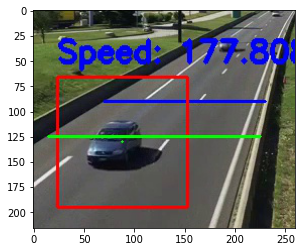

Predicted Class: 2012
Prediction Score:  0.5746128


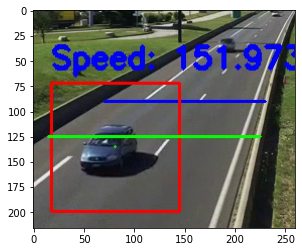

Predicted Class: 2012
Prediction Score:  0.7837914


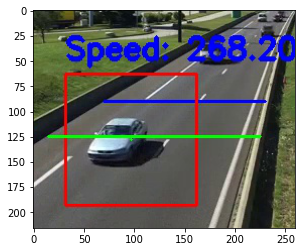

Predicted Class: 1998
Prediction Score:  0.28305373


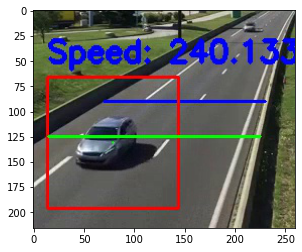

Predicted Class: 1998
Prediction Score:  0.3254806


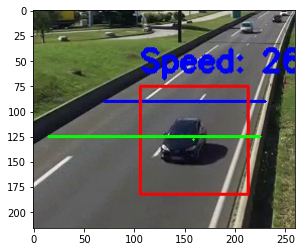

Predicted Class: 1998
Prediction Score:  0.28614405


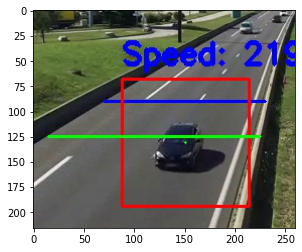

Predicted Class: 1998
Prediction Score:  0.37836623


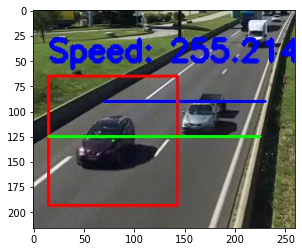

Predicted Class: 1998
Prediction Score:  0.42580143


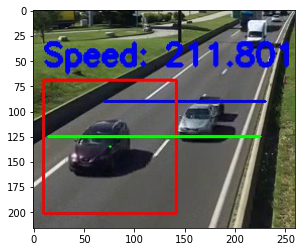

Predicted Class: 1998
Prediction Score:  0.5525898


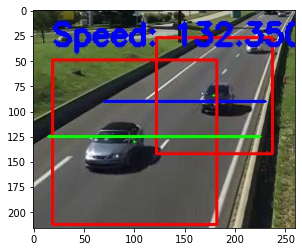

Predicted Class: 2012
Prediction Score:  0.8698679


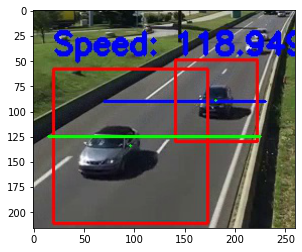

Predicted Class: 1998
Prediction Score:  0.24365444


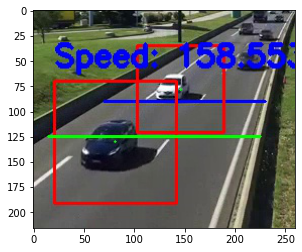

Predicted Class: 2012
Prediction Score:  0.9426443


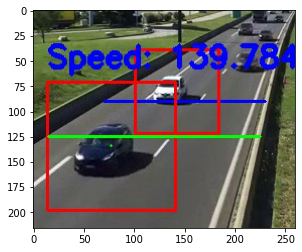

Predicted Class: 2012
Prediction Score:  0.9239381


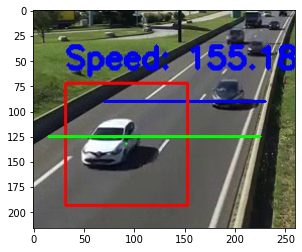

Predicted Class: 1998
Prediction Score:  0.3104973


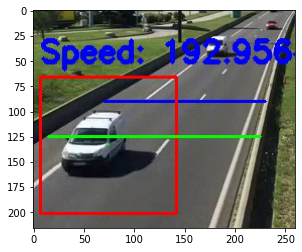

Predicted Class: 2012
Prediction Score:  0.7265134


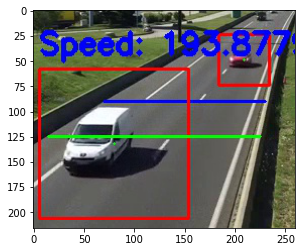

Predicted Class: 2012
Prediction Score:  0.98730624


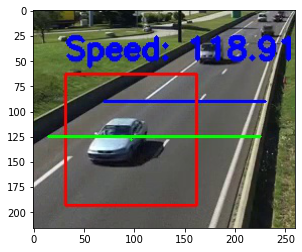

Predicted Class: 1998
Prediction Score:  0.28305373


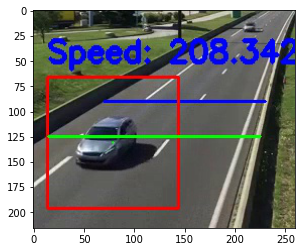

Predicted Class: 1998
Prediction Score:  0.3254806


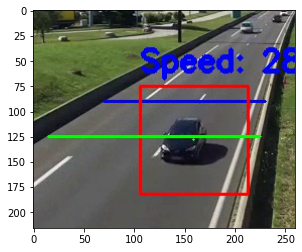

Predicted Class: 1998
Prediction Score:  0.28614405


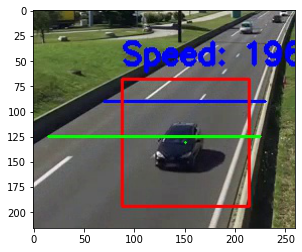

Predicted Class: 1998
Prediction Score:  0.37836623


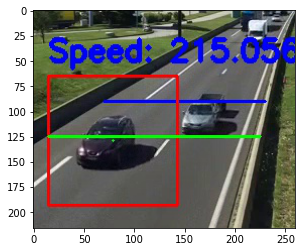

Predicted Class: 1998
Prediction Score:  0.42580143


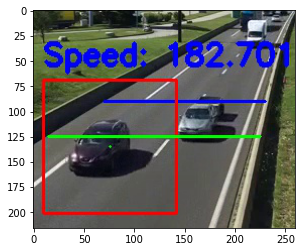

Predicted Class: 1998
Prediction Score:  0.5525898


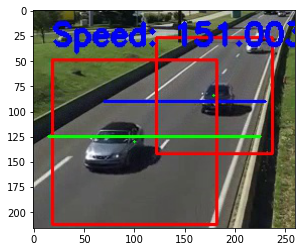

Predicted Class: 2012
Prediction Score:  0.8698679


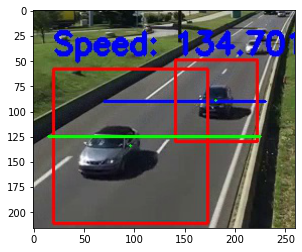

Predicted Class: 1998
Prediction Score:  0.24365444


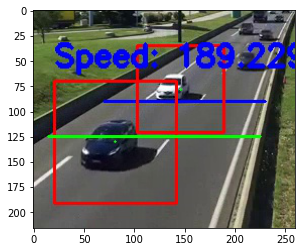

Predicted Class: 2012
Prediction Score:  0.9426443


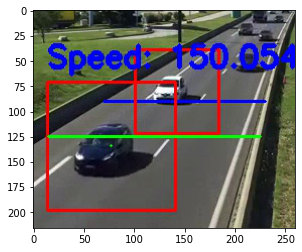

Predicted Class: 2012
Prediction Score:  0.9239381


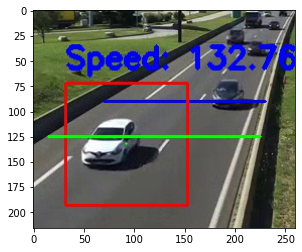

Predicted Class: 1998
Prediction Score:  0.3104973


In [ ]:
'''
def imageshow(img_count):
  for i in range(img_count):
    img_name1 = "/content/drive/MyDrive/RC/orgtst/img32/car{}.jpg".format(i)
    img1=mpimg.imread(img_name1)
    img_name2 = "/content/drive/MyDrive/RC/orgtst/img3/car{}.jpg".format(i)
    img2=mpimg.imread(img_name2)
    plt.imshow(img2)
    plt.show()
    predictions = gtf.Infer(img_name=img_name1, return_raw=False);
    print("Predicted Class: "+predictions['predicted_class'].replace('_',''))
    print("Prediction Score: ",predictions['score'])

path, dirs, files = next(os.walk("/content/drive/MyDrive/RC/orgtst/img32/"))
file_count = len(files)
imageshow(file_count)
'''